In [7]:
import openeo
from matplotlib import pyplot as plt
import rasterio.plot
import io
import tarfile
import numpy as np
import glob
import re
import os
import xarray as xr
import torch
import functions.handy_functions as hf

%matplotlib inline
plt.rcParams['figure.figsize'] = [20, 10]

In [8]:
#Set directory of found pairs
main_dir='/cloud/skogsstyrelsen_pairs/'
directories=os.listdir(main_dir)

In [9]:
#Import and format data
ims_all=[]
temporals_all=[]
for dir in directories:
    data_clear=xr.load_dataset(main_dir+dir+'/clear_data.nc', engine='netcdf4', decode_times=True)
    data_cloudy=xr.load_dataset(main_dir+dir+'/cloudy_data.nc', engine='netcdf4', decode_times=True)

    variables=data_clear.variables

    ## Get bands ##
    b02=variables['b02'].data
    b03=variables['b03'].data
    b04=variables['b04'].data
    b05=variables['b05'].data
    b06=variables['b06'].data
    b07=variables['b07'].data
    b08=variables['b08'].data
    b8a=variables['b8a'].data
    b09=variables['b09'].data
    b10=variables['b10'].data
    b11=variables['b11'].data
    b12=variables['b12'].data
    sun_z=variables['sun_zenith_angle'].data

    ## Save image ##
    im_clear=np.zeros((np.shape(b03)[0],np.shape(b03)[1],13))
    im_clear[:,:,0]=b02
    im_clear[:,:,1]=b03
    im_clear[:,:,2]=b04
    im_clear[:,:,3]=b05
    im_clear[:,:,4]=b06
    im_clear[:,:,5]=b07
    im_clear[:,:,6]=b08
    im_clear[:,:,7]=b8a
    im_clear[:,:,8]=b09
    im_clear[:,:,9]=b10
    im_clear[:,:,10]=b11
    im_clear[:,:,11]=b12
    im_clear[:,:,12]=sun_z

    variables=data_cloudy.variables

    ## Get bands ##
    b02=variables['b02'].data
    b03=variables['b03'].data
    b04=variables['b04'].data
    b05=variables['b05'].data
    b06=variables['b06'].data
    b07=variables['b07'].data
    b08=variables['b08'].data
    b8a=variables['b8a'].data
    b09=variables['b09'].data
    b10=variables['b10'].data
    b11=variables['b11'].data
    b12=variables['b12'].data
    sun_z=variables['sun_zenith_angle'].data

    ## Save image ##
    im_cloudy=np.zeros((np.shape(b03)[0],np.shape(b03)[1],13))
    im_cloudy[:,:,0]=b02
    im_cloudy[:,:,1]=b03
    im_cloudy[:,:,2]=b04
    im_cloudy[:,:,3]=b05
    im_cloudy[:,:,4]=b06
    im_cloudy[:,:,5]=b07
    im_cloudy[:,:,6]=b08
    im_cloudy[:,:,7]=b8a
    im_cloudy[:,:,8]=b09
    im_cloudy[:,:,9]=b10
    im_cloudy[:,:,10]=b11
    im_cloudy[:,:,11]=b12
    im_cloudy[:,:,12]=sun_z

    im_pair=[im_clear,im_cloudy]
    ims_all.append(im_pair)
    temporals_all.append([data_clear.coords['t'].data[0],data_cloudy.coords['t'].data[0]])

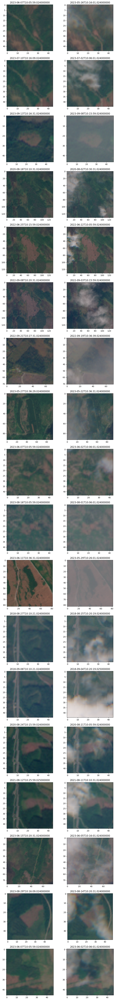

In [10]:
#Plot all clear/cloudy pairs
ncols=2
nrows=len(ims_all)

plt.rcParams['figure.figsize'] = [5*ncols, 5*nrows]
fig,axs=plt.subplots(ncols=ncols,nrows=nrows)

pair_c=0
for i,pair in enumerate(ims_all):

    im_clear=pair[0]
    im_cloud=pair[1]

    axs[pair_c,0].imshow(hf.Sentinel2TrueColor(im_clear))
    axs[pair_c,0].set_title(temporals_all[i][0])
    axs[pair_c,1].imshow(hf.Sentinel2TrueColor(im_cloud))
    axs[pair_c,1].set_title(temporals_all[i][1])
    pair_c+=1

In [11]:
#Load tuned model
#main_filepath='pytorch_models/Ultimate_model'
main_filepath='pytorch_models/Final_model_dataset4'
n_ensemble=10
models=[]
for i in range(n_ensemble):
    models.append(torch.load(main_filepath+'/model'+str(i)+'/model_file'))

quantiles = np.array([0.1,0.5,0.9])
est = np.where(quantiles==0.5)[0].item()
 

In [12]:
#Make predictions and save with uncertanties

preds_all=[]
uncertainties_all=[]
lower_all=[]
higher_all=[]
for i,pair in enumerate(ims_all):
    im_cloud=pair[1]

    ## Reshape cloudy data
    im_shape=np.shape(im_cloud)
    im_cloud_r=np.zeros((im_shape[0]*im_shape[1],im_shape[2]))
    for i in range(im_shape[2]):
        im_cloud_r[:,i]=np.reshape(im_cloud[:,:,i],im_shape[0]*im_shape[1])

    ## Make prediction
    for i,model in enumerate(models):
        if i==0:
            pred=model.predict(im_cloud_r)
        else:   
            pred=pred+model.predict(im_cloud_r)
    pred=pred/len(models)

    #Reshape back
    im_shape_pred=(im_shape[0],im_shape[1],12)
    im_pred=np.zeros(im_shape_pred)
    im_unc=np.zeros(im_shape_pred)
    im_lower=np.zeros(im_shape_pred)
    im_higher=np.zeros(im_shape_pred)   
    for i in range(im_shape_pred[2]):
        im_pred[:,:,i]=np.reshape(pred[:,i,est],im_shape_pred[0:2])
        im_unc[:,:,i]=np.reshape(pred[:,i,-1]-pred[:,i,0],im_shape_pred[0:2])
        im_lower[:,:,i]=np.reshape(pred[:,i,0],im_shape_pred[0:2])
        im_higher[:,:,i]=np.reshape(pred[:,i,-1],im_shape_pred[0:2])

    preds_all.append(im_pred)
    uncertainties_all.append(im_unc)
    lower_all.append(im_lower)
    higher_all.append(im_higher)

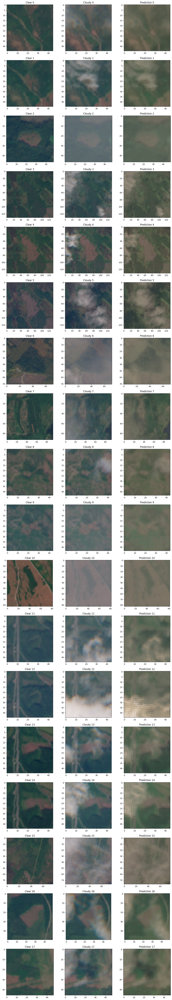

In [13]:
#Print clear, cloudy and predictions
ncols=3
nrows=len(ims_all)

plt.rcParams['figure.figsize'] = [5*ncols, 5*nrows]
fig,axs=plt.subplots(ncols=ncols,nrows=nrows)

pair_c=0
for i,pair in enumerate(ims_all):

    im_clear=pair[0]
    im_cloud=pair[1]

    axs[pair_c,0].imshow(hf.Sentinel2TrueColor(im_clear))
    axs[pair_c,0].set_title('Clear %i'%pair_c)
    axs[pair_c,1].imshow(hf.Sentinel2TrueColor(im_cloud))
    axs[pair_c,1].set_title('Cloudy %i'%pair_c)
    axs[pair_c,2].imshow(hf.Sentinel2TrueColor(preds_all[i]))
    axs[pair_c,2].set_title('Prediction %i'%pair_c)
    
    pair_c+=1

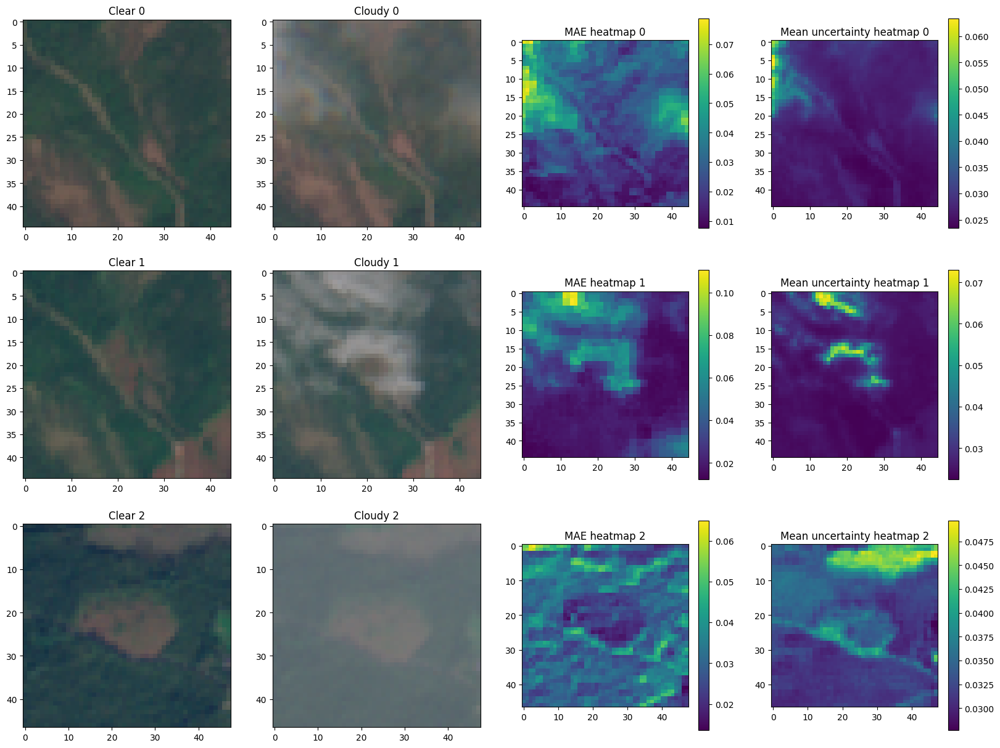

In [14]:
#Print clear, cloudy and predictions
ncols=4
nrows=3

plt.rcParams['figure.figsize'] = [5*ncols, 5*nrows]
fig,axs=plt.subplots(ncols=ncols,nrows=nrows)

pair_c=0
for i,pair in enumerate(ims_all[:3]):

    im_clear=pair[0]
    im_cloud=pair[1]
    im_pred=preds_all[i]
    im_unc=uncertainties_all[i]

    im_MAE=np.mean(np.abs(im_clear[:,:,:12]-im_pred),axis=2)
    im_Munc=np.mean(im_unc,axis=2)

    axs[pair_c,0].imshow(hf.Sentinel2TrueColor(im_clear))
    axs[pair_c,0].set_title('Clear %i'%pair_c)
    axs[pair_c,1].imshow(hf.Sentinel2TrueColor(im_cloud))
    axs[pair_c,1].set_title('Cloudy %i'%pair_c)
    mae=axs[pair_c,2].imshow(im_MAE)
    fig.colorbar(mae,ax=axs[pair_c,2])
    axs[pair_c,2].set_title('MAE heatmap %i'%pair_c)
    munc=axs[pair_c,3].imshow(im_Munc)
    fig.colorbar(munc,ax=axs[pair_c,3])
    axs[pair_c,3].set_title('Mean uncertainty heatmap %i'%pair_c)

    
    pair_c+=1

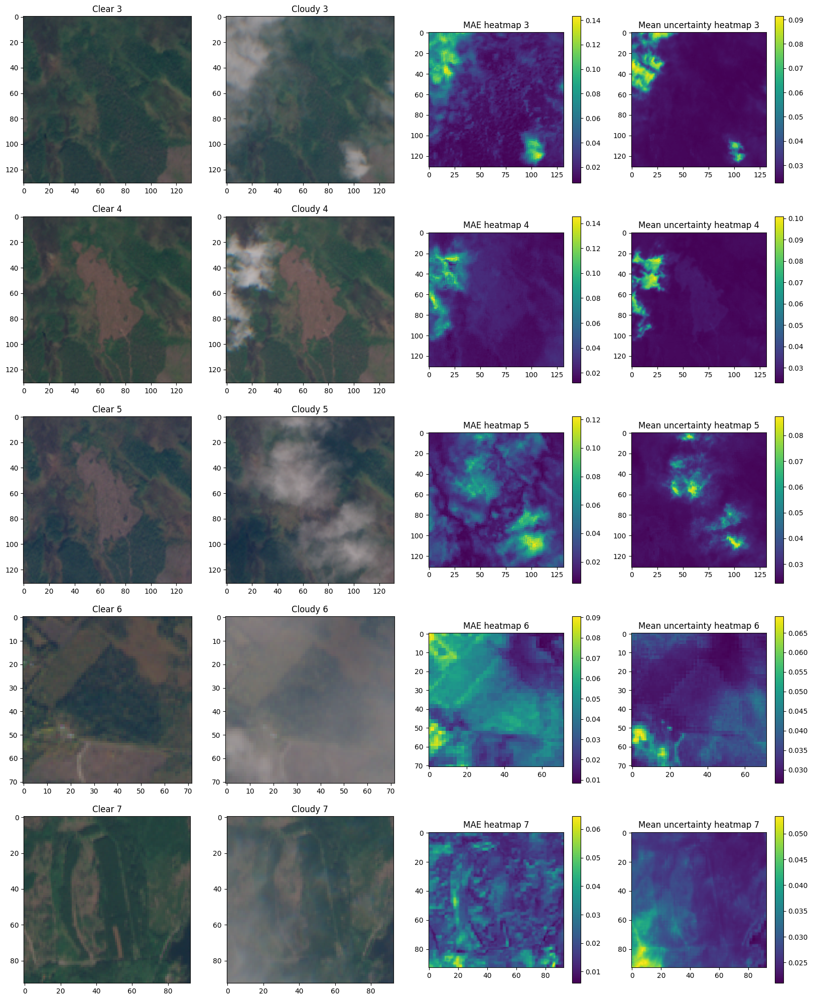

In [15]:
#Print clear, cloudy and predictions
ncols=4
nrows=5

plt.rcParams['figure.figsize'] = [5*ncols, 5*nrows]
fig,axs=plt.subplots(ncols=ncols,nrows=nrows)

pair_c=0
for i,pair in enumerate(ims_all[3:8]):
    i=i+3
    im_clear=pair[0]
    im_cloud=pair[1]
    im_pred=preds_all[i]
    im_unc=uncertainties_all[i]

    im_MAE=np.mean(np.abs(im_clear[:,:,:12]-im_pred),axis=2)
    im_Munc=np.mean(im_unc,axis=2)

    axs[pair_c,0].imshow(hf.Sentinel2TrueColor(im_clear))
    axs[pair_c,0].set_title('Clear %i'%i)
    axs[pair_c,1].imshow(hf.Sentinel2TrueColor(im_cloud))
    axs[pair_c,1].set_title('Cloudy %i'%i)
    mae=axs[pair_c,2].imshow(im_MAE)
    fig.colorbar(mae,ax=axs[pair_c,2])
    axs[pair_c,2].set_title('MAE heatmap %i'%i)
    munc=axs[pair_c,3].imshow(im_Munc)
    fig.colorbar(munc,ax=axs[pair_c,3])
    axs[pair_c,3].set_title('Mean uncertainty heatmap %i'%i)

    
    pair_c+=1

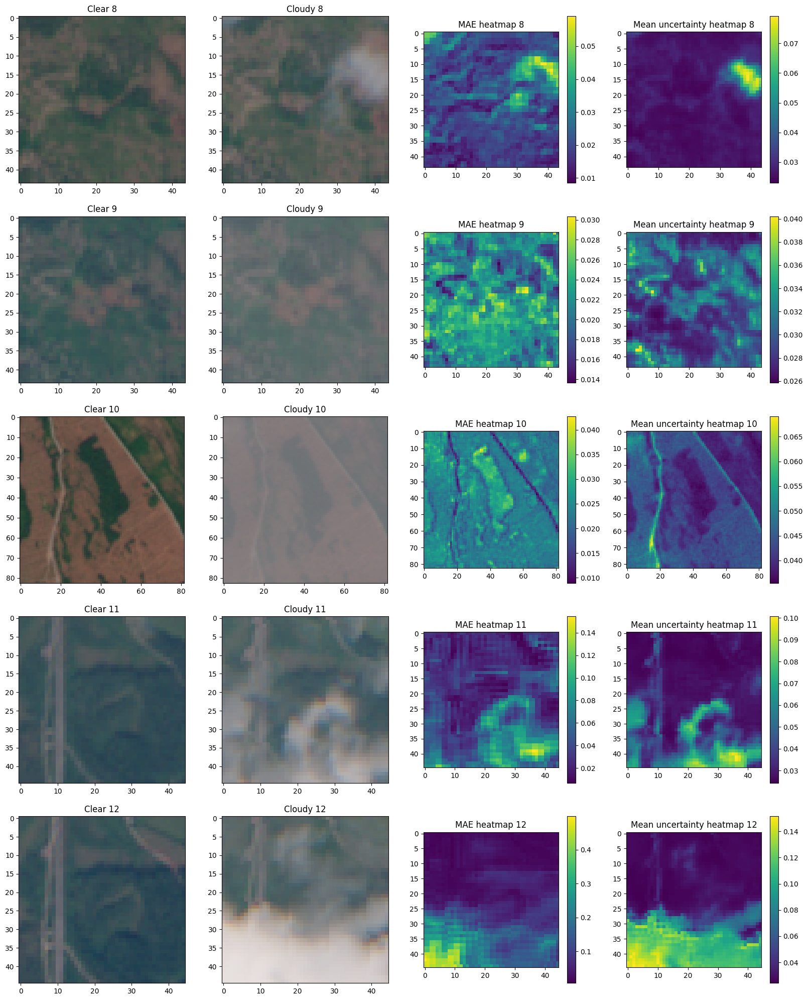

In [16]:
#Print clear, cloudy and predictions
ncols=4
nrows=5

plt.rcParams['figure.figsize'] = [5*ncols, 5*nrows]
fig,axs=plt.subplots(ncols=ncols,nrows=nrows)

pair_c=0
for i,pair in enumerate(ims_all[8:13]):
    i=i+8
    im_clear=pair[0]
    im_cloud=pair[1]
    im_pred=preds_all[i]
    im_unc=uncertainties_all[i]

    im_MAE=np.mean(np.abs(im_clear[:,:,:12]-im_pred),axis=2)
    im_Munc=np.mean(im_unc,axis=2)

    axs[pair_c,0].imshow(hf.Sentinel2TrueColor(im_clear))
    axs[pair_c,0].set_title('Clear %i'%i)
    axs[pair_c,1].imshow(hf.Sentinel2TrueColor(im_cloud))
    axs[pair_c,1].set_title('Cloudy %i'%i)
    mae=axs[pair_c,2].imshow(im_MAE)
    fig.colorbar(mae,ax=axs[pair_c,2])
    axs[pair_c,2].set_title('MAE heatmap %i'%i)
    munc=axs[pair_c,3].imshow(im_Munc)
    fig.colorbar(munc,ax=axs[pair_c,3])
    axs[pair_c,3].set_title('Mean uncertainty heatmap %i'%i)

    
    pair_c+=1

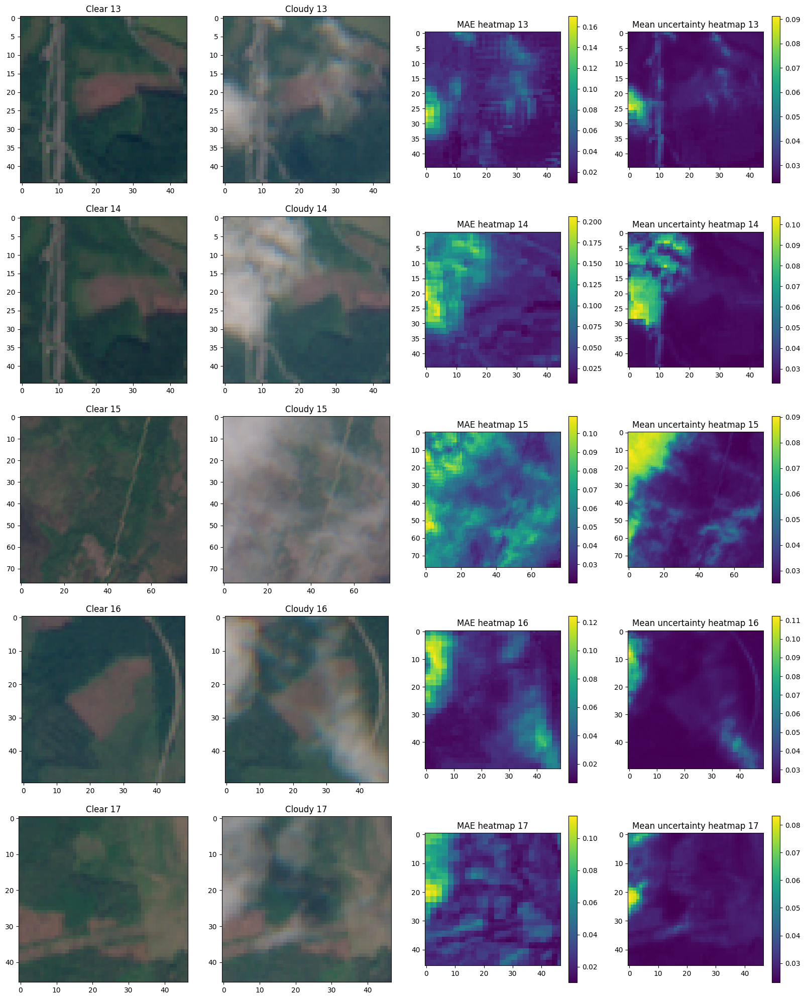

In [17]:
#Print clear, cloudy and predictions
ncols=4
nrows=5

plt.rcParams['figure.figsize'] = [5*ncols, 5*nrows]
fig,axs=plt.subplots(ncols=ncols,nrows=nrows)

pair_c=0
for i,pair in enumerate(ims_all[13:18]):
    i=i+13
    im_clear=pair[0]
    im_cloud=pair[1]
    im_pred=preds_all[i]
    im_unc=uncertainties_all[i]

    im_MAE=np.mean(np.abs(im_clear[:,:,:12]-im_pred),axis=2)
    im_Munc=np.mean(im_unc,axis=2)

    axs[pair_c,0].imshow(hf.Sentinel2TrueColor(im_clear))
    axs[pair_c,0].set_title('Clear %i'%i)
    axs[pair_c,1].imshow(hf.Sentinel2TrueColor(im_cloud))
    axs[pair_c,1].set_title('Cloudy %i'%i)
    mae=axs[pair_c,2].imshow(im_MAE)
    fig.colorbar(mae,ax=axs[pair_c,2])
    axs[pair_c,2].set_title('MAE heatmap %i'%i)
    munc=axs[pair_c,3].imshow(im_Munc)
    fig.colorbar(munc,ax=axs[pair_c,3])
    axs[pair_c,3].set_title('Mean uncertainty heatmap %i'%i)

    
    pair_c+=1

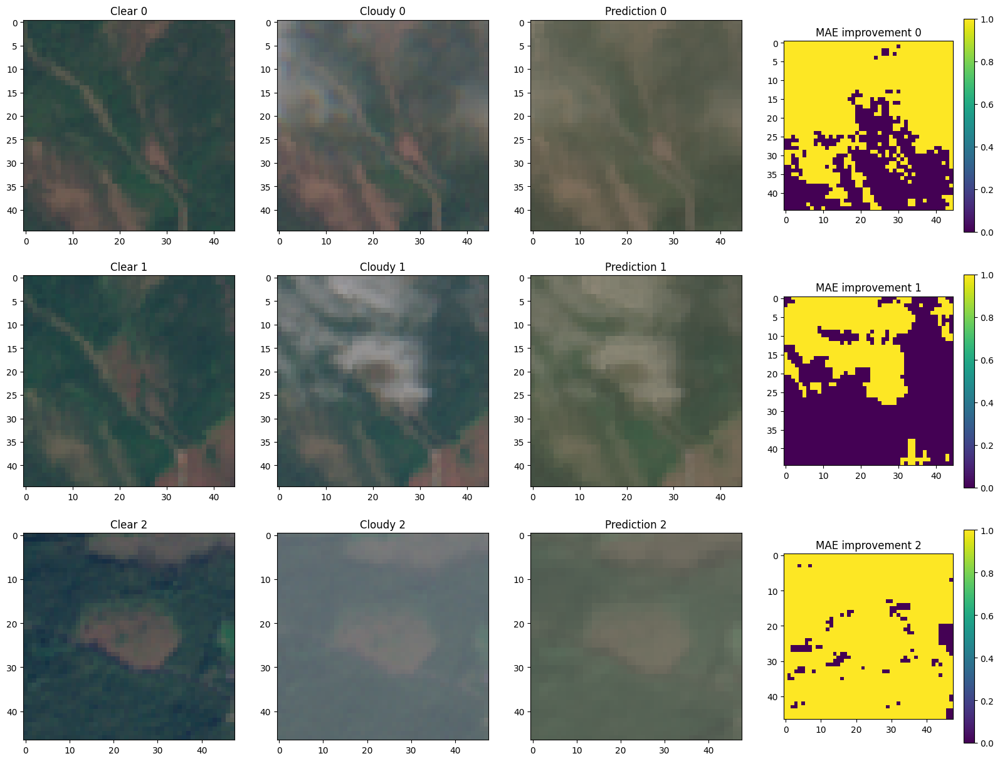

In [18]:
#Print clear, cloudy and predictions
ncols=4
nrows=3

plt.rcParams['figure.figsize'] = [5*ncols, 5*nrows]
fig,axs=plt.subplots(ncols=ncols,nrows=nrows)

pair_c=0
for i,pair in enumerate(ims_all[:3]):

    im_clear=pair[0]
    im_cloud=pair[1]
    im_pred=preds_all[i]

    im_cloud_MAE=np.mean(np.abs(im_clear[:,:,:12]-im_cloud[:,:,:12]),axis=2)
    im_pred_MAE=np.mean(np.abs(im_clear[:,:,:12]-im_pred),axis=2)
    im_Imp=((im_cloud_MAE-im_pred_MAE)>0).astype('i1')

    axs[pair_c,0].imshow(hf.Sentinel2TrueColor(im_clear))
    axs[pair_c,0].set_title('Clear %i'%pair_c)
    axs[pair_c,1].imshow(hf.Sentinel2TrueColor(im_cloud))
    axs[pair_c,1].set_title('Cloudy %i'%pair_c)
    axs[pair_c,2].imshow(hf.Sentinel2TrueColor(im_pred))
    axs[pair_c,2].set_title('Prediction %i'%pair_c)    
    mae=axs[pair_c,3].imshow(im_Imp)
    fig.colorbar(mae,ax=axs[pair_c,3])
    axs[pair_c,3].set_title('MAE improvement %i'%pair_c)

    
    pair_c+=1

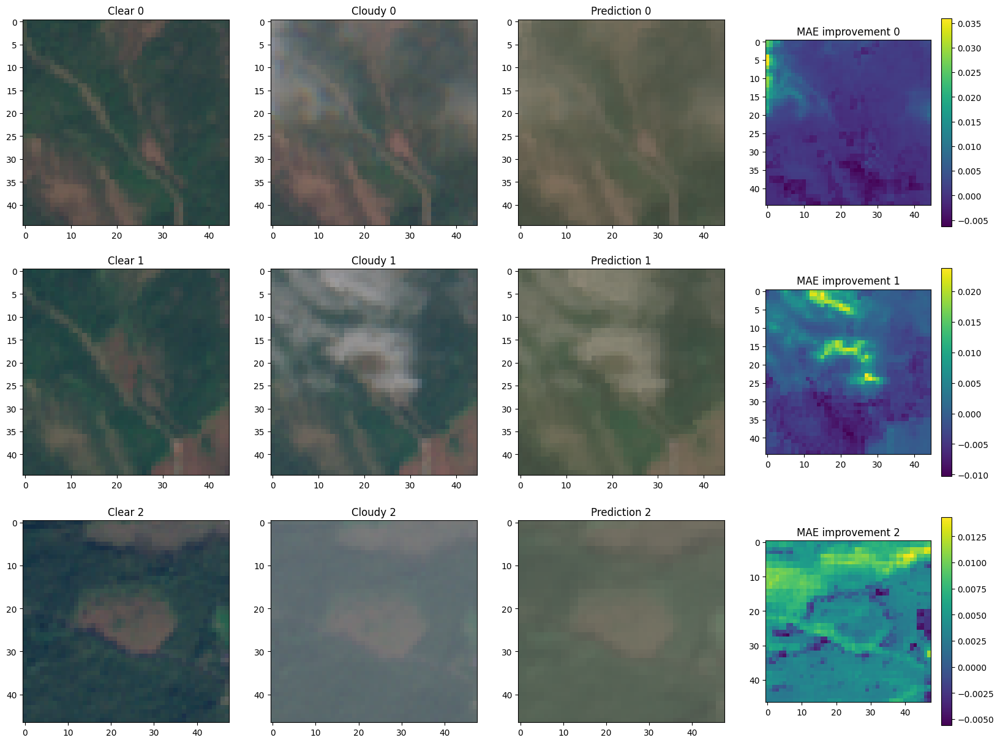

In [19]:
#Print clear, cloudy and predictions
ncols=4
nrows=3

plt.rcParams['figure.figsize'] = [5*ncols, 5*nrows]
fig,axs=plt.subplots(ncols=ncols,nrows=nrows)

pair_c=0
for i,pair in enumerate(ims_all[:3]):

    im_clear=pair[0]
    im_cloud=pair[1]
    im_pred=preds_all[i]

    im_cloud_MAE=np.mean(np.abs(im_clear[:,:,:12]-im_cloud[:,:,:12]),axis=2)
    im_pred_MAE=np.mean(np.abs(im_clear[:,:,:12]-im_pred),axis=2)
    im_Imp=im_cloud_MAE-im_pred_MAE

    axs[pair_c,0].imshow(hf.Sentinel2TrueColor(im_clear))
    axs[pair_c,0].set_title('Clear %i'%pair_c)
    axs[pair_c,1].imshow(hf.Sentinel2TrueColor(im_cloud))
    axs[pair_c,1].set_title('Cloudy %i'%pair_c)
    axs[pair_c,2].imshow(hf.Sentinel2TrueColor(im_pred))
    axs[pair_c,2].set_title('Prediction %i'%pair_c)    
    mae=axs[pair_c,3].imshow(im_Imp)
    fig.colorbar(mae,ax=axs[pair_c,3])
    axs[pair_c,3].set_title('MAE improvement %i'%pair_c)

    
    pair_c+=1

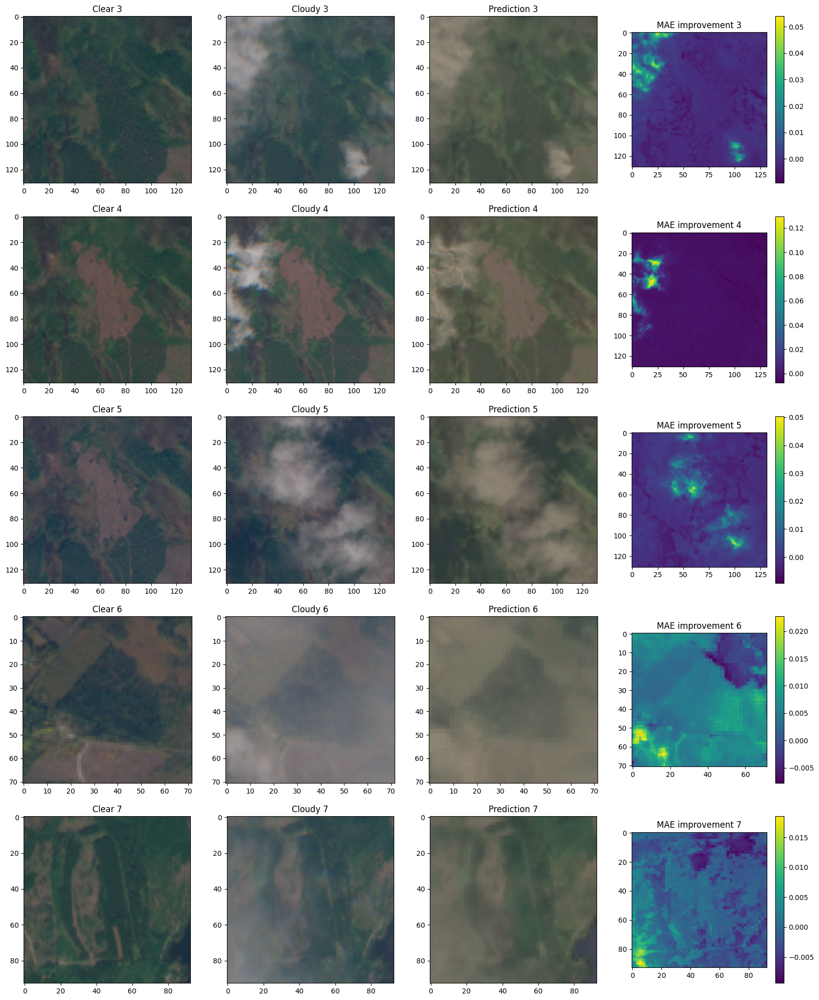

In [20]:
#Print clear, cloudy and predictions
ncols=4
nrows=5

plt.rcParams['figure.figsize'] = [5*ncols, 5*nrows]
fig,axs=plt.subplots(ncols=ncols,nrows=nrows)

pair_c=0
for i,pair in enumerate(ims_all[3:8]):
    i=i+3
    im_clear=pair[0]
    im_cloud=pair[1]
    im_pred=preds_all[i]

    im_cloud_MAE=np.mean(np.abs(im_clear[:,:,:12]-im_cloud[:,:,:12]),axis=2)
    im_pred_MAE=np.mean(np.abs(im_clear[:,:,:12]-im_pred),axis=2)
    im_Imp=im_cloud_MAE-im_pred_MAE

    axs[pair_c,0].imshow(hf.Sentinel2TrueColor(im_clear))
    axs[pair_c,0].set_title('Clear %i'%i)
    axs[pair_c,1].imshow(hf.Sentinel2TrueColor(im_cloud))
    axs[pair_c,1].set_title('Cloudy %i'%i)
    axs[pair_c,2].imshow(hf.Sentinel2TrueColor(im_pred))
    axs[pair_c,2].set_title('Prediction %i'%i)    
    mae=axs[pair_c,3].imshow(im_Imp)
    fig.colorbar(mae,ax=axs[pair_c,3])
    axs[pair_c,3].set_title('MAE improvement %i'%i)

    
    pair_c+=1

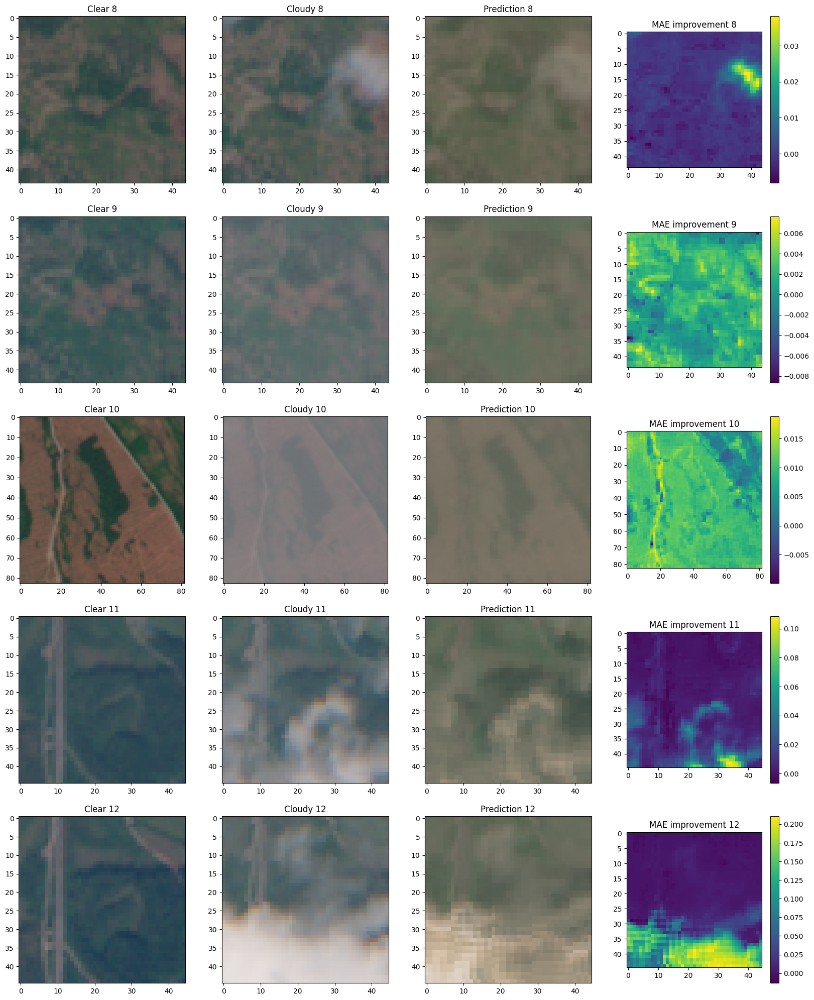

In [21]:
#Print clear, cloudy and predictions
ncols=4
nrows=5

plt.rcParams['figure.figsize'] = [5*ncols, 5*nrows]
fig,axs=plt.subplots(ncols=ncols,nrows=nrows)

pair_c=0
for i,pair in enumerate(ims_all[8:13]):
    i=i+8
    im_clear=pair[0]
    im_cloud=pair[1]
    im_pred=preds_all[i]

    im_cloud_MAE=np.mean(np.abs(im_clear[:,:,:12]-im_cloud[:,:,:12]),axis=2)
    im_pred_MAE=np.mean(np.abs(im_clear[:,:,:12]-im_pred),axis=2)
    im_Imp=im_cloud_MAE-im_pred_MAE

    axs[pair_c,0].imshow(hf.Sentinel2TrueColor(im_clear))
    axs[pair_c,0].set_title('Clear %i'%i)
    axs[pair_c,1].imshow(hf.Sentinel2TrueColor(im_cloud))
    axs[pair_c,1].set_title('Cloudy %i'%i)
    axs[pair_c,2].imshow(hf.Sentinel2TrueColor(im_pred))
    axs[pair_c,2].set_title('Prediction %i'%i)    
    mae=axs[pair_c,3].imshow(im_Imp)
    fig.colorbar(mae,ax=axs[pair_c,3])
    axs[pair_c,3].set_title('MAE improvement %i'%i)

    
    pair_c+=1

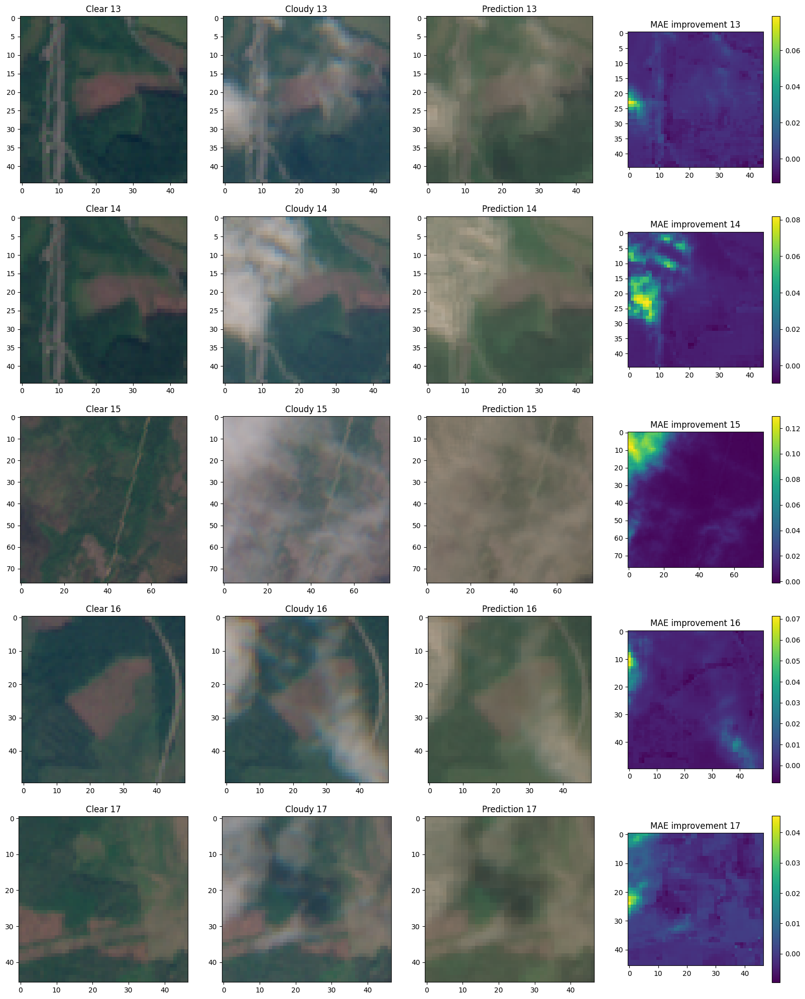

In [22]:
#Print clear, cloudy and predictions
ncols=4
nrows=5

plt.rcParams['figure.figsize'] = [5*ncols, 5*nrows]
fig,axs=plt.subplots(ncols=ncols,nrows=nrows)

pair_c=0
for i,pair in enumerate(ims_all[13:18]):
    i=i+13
    im_clear=pair[0]
    im_cloud=pair[1]
    im_pred=preds_all[i]

    im_cloud_MAE=np.mean(np.abs(im_clear[:,:,:12]-im_cloud[:,:,:12]),axis=2)
    im_pred_MAE=np.mean(np.abs(im_clear[:,:,:12]-im_pred),axis=2)
    im_Imp=im_cloud_MAE-im_pred_MAE

    axs[pair_c,0].imshow(hf.Sentinel2TrueColor(im_clear))
    axs[pair_c,0].set_title('Clear %i'%i)
    axs[pair_c,1].imshow(hf.Sentinel2TrueColor(im_cloud))
    axs[pair_c,1].set_title('Cloudy %i'%i)
    axs[pair_c,2].imshow(hf.Sentinel2TrueColor(im_pred))
    axs[pair_c,2].set_title('Prediction %i'%i)    
    mae=axs[pair_c,3].imshow(im_Imp)
    fig.colorbar(mae,ax=axs[pair_c,3])
    axs[pair_c,3].set_title('MAE improvement %i'%i)

    
    pair_c+=1

In [23]:
#Evaluate through NMSE

n_pairs=len(preds_all)

NMSEs_og=np.zeros((n_pairs,12))
NMSEs_pred=np.zeros((n_pairs,12))

p_c=0
for i,pair in enumerate(ims_all):

    im_cloud=pair[1]
    im_clear=pair[0]
    im_pred=preds_all[i]

    #np.linal.norm() -> Frobenius norm i.e root of the sum of squares
    norm_og=np.linalg.norm((im_clear[:,:,0:12])-(im_cloud[:,:,0:12]),axis=(0,1))**2
    norm_pred=np.linalg.norm((im_clear[:,:,0:12])-im_pred[:,:,0:12],axis=(0,1))**2
    norm_gt=np.linalg.norm(im_clear[:,:,0:12],axis=(0,1))**2

    NMSE_og=norm_og/norm_gt
    NMSE_pred=norm_pred/norm_gt

    NMSEs_og[p_c,:]=NMSE_og
    NMSEs_pred[p_c,:]=NMSE_pred
    p_c+=1

mean_NMSE_og=np.mean(NMSEs_og,axis=0)
mean_NMSE_pred=np.mean(NMSEs_pred,axis=0)

mean_NMSE_og_wo_10=np.concatenate((mean_NMSE_og[0:9],mean_NMSE_og[10:]),axis=0)
mean_NMSE_pred_wo_10=np.concatenate((mean_NMSE_pred[0:9],mean_NMSE_pred[10:]),axis=0)

for i in range(len(mean_NMSE_og)):
    if i<=6:
        print('NMSE before correction, Band '+str(i+2)+': '+str(mean_NMSE_og[i]))
        print('NMSE after correction, Band '+str(i+2)+': '+str(mean_NMSE_pred[i]))
    elif i==7:
        print('NMSE before correction, Band '+str(i+1)+'A: '+str(mean_NMSE_og[i]))
        print('NMSE after correction, Band '+str(i+1)+'A: '+str(mean_NMSE_pred[i]))
    else:
        print('NMSE before correction, Band '+str(i+1)+': '+str(mean_NMSE_og[i]))
        print('NMSE after correction, Band '+str(i+1)+': '+str(mean_NMSE_pred[i]))    

    print(' ')

print('Mean NMSE before correction: '+str(np.mean(mean_NMSE_og)))
print('Mean NMSE after correction: '+str(np.mean(mean_NMSE_pred)))    

print(' ')

print('Mean NMSE before correction, without band 10: '+str(np.mean(mean_NMSE_og_wo_10)))
print('Mean NMSE after correction, without band 10: '+str(np.mean(mean_NMSE_pred_wo_10)))


NMSE before correction, Band 2: 0.40022542608828293
NMSE after correction, Band 2: 0.08531929859128753
 
NMSE before correction, Band 3: 0.6212890787256616
NMSE after correction, Band 3: 0.2693146198631837
 
NMSE before correction, Band 4: 1.5116504378187048
NMSE after correction, Band 4: 0.7858143424280432
 
NMSE before correction, Band 5: 0.7250211653587733
NMSE after correction, Band 5: 0.41316804771429766
 
NMSE before correction, Band 6: 0.18495176309883093
NMSE after correction, Band 6: 0.1527492388211724
 
NMSE before correction, Band 7: 0.14537585927097002
NMSE after correction, Band 7: 0.106219018347929
 
NMSE before correction, Band 8: 0.1327387139056492
NMSE after correction, Band 8: 0.09637301885250099
 
NMSE before correction, Band 8A: 0.12652202716872862
NMSE after correction, Band 8A: 0.07255827757483971
 
NMSE before correction, Band 9: 0.6173873387396649
NMSE after correction, Band 9: 0.44494910532738324
 
NMSE before correction, Band 10: 1.8206887445567332
NMSE after 

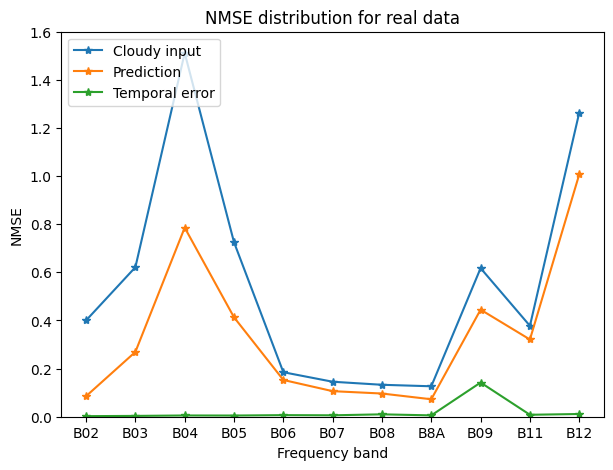

In [24]:
temp_bias = np.array([0.0024,0.0034,0.0052,0.0049,0.0066,0.0059,0.0099,0.0056,0.1421,1.2973,0.0081,0.0113])


bands=np.array([0,1,2,3,4,5,6,7,8,10,11])
x=np.arange(np.size(bands))

plt.rcParams['figure.figsize'] = [7, 5]

plt.figure()
plt.plot(x,mean_NMSE_og[bands],'-*')
plt.plot(x,mean_NMSE_pred[bands],'-*')
plt.plot(x,temp_bias[bands],'-*')
plt.xticks(x, ['B02','B03','B04','B05','B06','B07','B08','B8A','B09','B11','B12'])
plt.xlabel('Frequency band')
plt.ylabel('NMSE')
plt.legend(['Cloudy input','Prediction','Temporal error'],loc='upper left')
plt.ylim([0,1.6])
plt.title('NMSE distribution for real data')
plt.show()

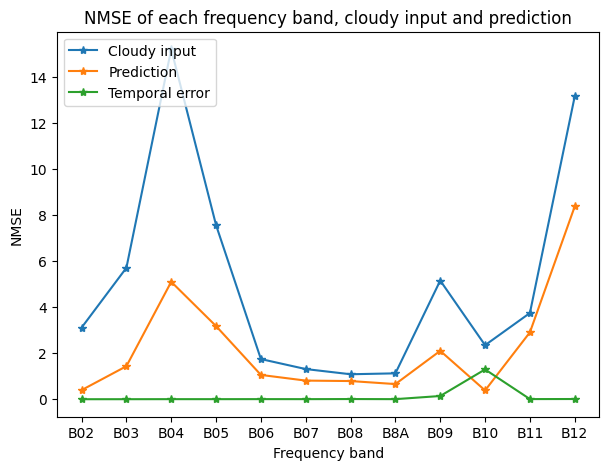

In [25]:
pair_no=12

bands=np.array([0,1,2,3,4,5,6,7,8,9,10,11])

bandnames=np.array(['B02','B03','B04','B05','B06','B07','B08','B8A','B09','B10','B11','B12'])
x=np.arange(np.size(bands))

plt.rcParams['figure.figsize'] = [7, 5]

plt.figure()
plt.plot(x,NMSEs_og[pair_no,bands],'-*')
plt.plot(x,NMSEs_pred[pair_no,bands],'-*')
plt.plot(x,temp_bias[bands],'-*')
plt.xticks(x, bandnames[bands])
plt.xlabel('Frequency band')
plt.ylabel('NMSE')
plt.legend(['Cloudy input','Prediction','Temporal error'],loc='upper left')

plt.title('NMSE of each frequency band, cloudy input and prediction')
plt.show()

In [26]:
clear_r = np.array([], dtype=np.int64).reshape(0,12)
cloud_r = np.array([], dtype=np.int64).reshape(0,12)
pred_r = np.array([], dtype=np.int64).reshape(0,12)
lower_r = np.array([], dtype=np.int64).reshape(0,12)
higher_r = np.array([], dtype=np.int64).reshape(0,12)
unc_r = np.array([], dtype=np.int64).reshape(0,12)

for i,pair in enumerate(ims_all):
    im_clear=pair[0]
    im_cloud=pair[1]
    im_pred=preds_all[i]
    im_lower=lower_all[i]
    im_higher=higher_all[i]
    im_unc=uncertainties_all[i]

    ## Reshape clear data
    im_shape=np.shape(im_pred)
    im_clear_r=np.zeros((im_shape[0]*im_shape[1],im_shape[2]))
    for i in range(im_shape[2]):
        im_clear_r[:,i]=np.reshape(im_clear[:,:,i],im_shape[0]*im_shape[1])

    ## Reshape cloud data
    im_cloud_r=np.zeros((im_shape[0]*im_shape[1],im_shape[2]))
    for i in range(im_shape[2]):
        im_cloud_r[:,i]=np.reshape(im_cloud[:,:,i],im_shape[0]*im_shape[1])

    ## Reshape pred data
    im_pred_r=np.zeros((im_shape[0]*im_shape[1],im_shape[2]))
    for i in range(im_shape[2]):
        im_pred_r[:,i]=np.reshape(im_pred[:,:,i],im_shape[0]*im_shape[1])

    ## Reshape lower data
    im_lower_r=np.zeros((im_shape[0]*im_shape[1],im_shape[2]))
    for i in range(im_shape[2]):
        im_lower_r[:,i]=np.reshape(im_lower[:,:,i],im_shape[0]*im_shape[1])

    ## Reshape higher data
    im_higher_r=np.zeros((im_shape[0]*im_shape[1],im_shape[2]))
    for i in range(im_shape[2]):
        im_higher_r[:,i]=np.reshape(im_higher[:,:,i],im_shape[0]*im_shape[1])

    ## Reshape unc data
    im_unc_r=np.zeros((im_shape[0]*im_shape[1],im_shape[2]))
    for i in range(im_shape[2]):
        im_unc_r[:,i]=np.reshape(im_unc[:,:,i],im_shape[0]*im_shape[1])

    clear_r=np.vstack([clear_r, im_clear_r])
    cloud_r=np.vstack([cloud_r, im_cloud_r])
    pred_r=np.vstack([pred_r, im_pred_r])
    lower_r=np.vstack([lower_r, im_lower_r])
    higher_r=np.vstack([higher_r, im_higher_r])
    unc_r=np.vstack([unc_r, im_unc_r])

gigapred=np.stack((lower_r,pred_r,higher_r),axis=2)

In [27]:
def quant_rate_bands(y_true,y_pred):
    quantcount = np.zeros([np.shape(y_pred)[1],np.shape(y_pred)[2]])
    for i in range(np.shape(y_pred)[0]):
        for j in range(np.shape(y_pred)[1]):
            for k in range(np.shape(y_pred)[2]):
                if y_true[i,j] < y_pred[i,j,k]:
                    quantcount[j,k] = quantcount[j,k] + 1 

    quantrate = quantcount/np.shape(y_true)[0]

    return quantrate

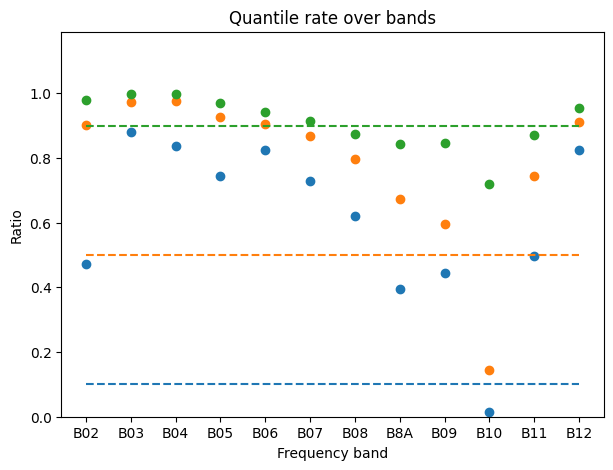

[0.60680133 0.7842733  0.90897457]
0.4397168275100125


In [28]:

Quant_rates = quant_rate_bands(clear_r,gigapred)

bands=np.array([0,1,2,3,4,5,6,7,8,9,10,11])
x=np.arange(np.size(bands))
plt.figure()

#plt.plot(np.array([0,11]),np.array([0.1,0.1]))
#plt.plot(np.array([0,11]),np.array([0.5,0.5]))
#plt.plot(np.array([0,11]),np.array([0.9,0.9]))

for quant in range(len(quantiles)):
    plt.plot(np.array([bands[0],bands[-1]]),np.array([quantiles[quant],quantiles[quant]]),'--')
    plt.scatter(x,Quant_rates[:,quant],label='Predicted %s quantile'%str(quantiles[quant]))

plt.xticks(x, ['B02','B03','B04','B05','B06','B07','B08','B8A','B09','B10','B11','B12'])
plt.title('Quantile rate over bands')
plt.xlabel('Frequency band')
plt.ylabel('Ratio')
#plt.legend(loc='lower left')
plt.ylim([0,1.19])
plt.show()

from multivariate_quantile_regression.network_model import QuantileNetwork
print(QuantileNetwork.quant_rate(clear_r,gigapred))

print(QuantileNetwork.mean_marginal_loss(clear_r,gigapred,quantiles))

In [29]:
print(quantiles)

[0.1 0.5 0.9]


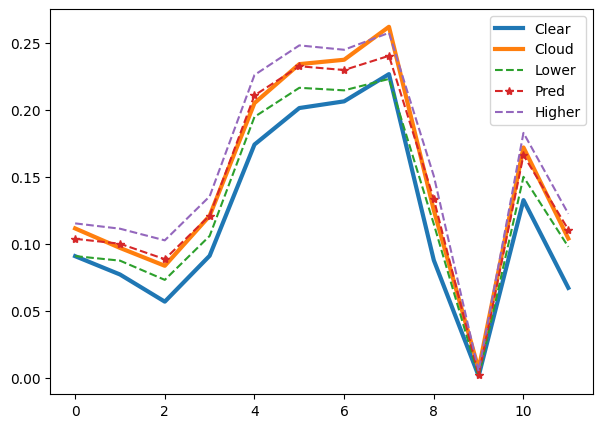

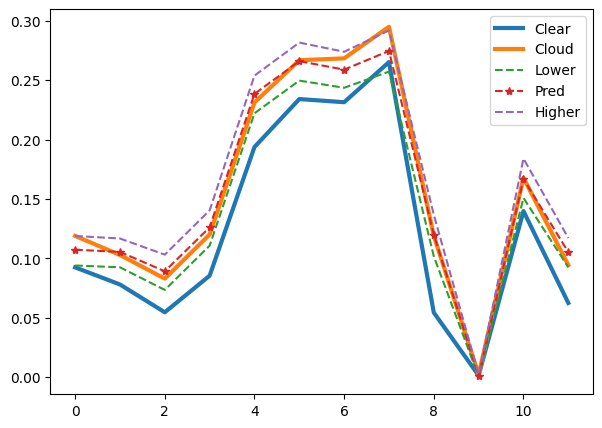

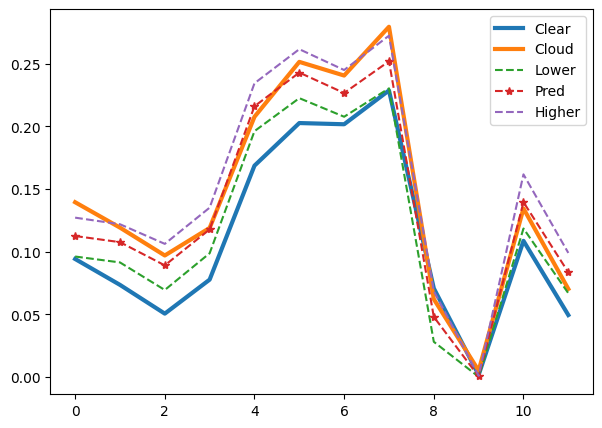

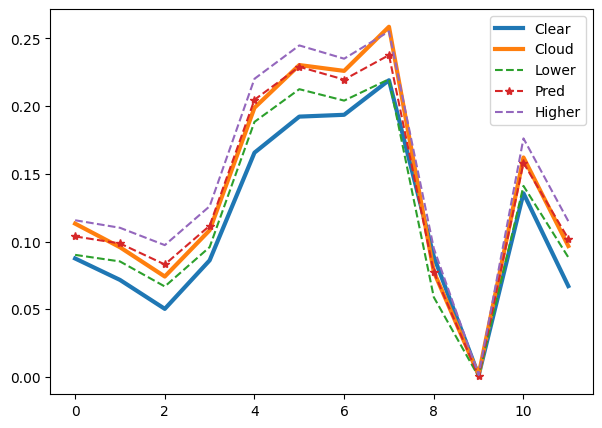

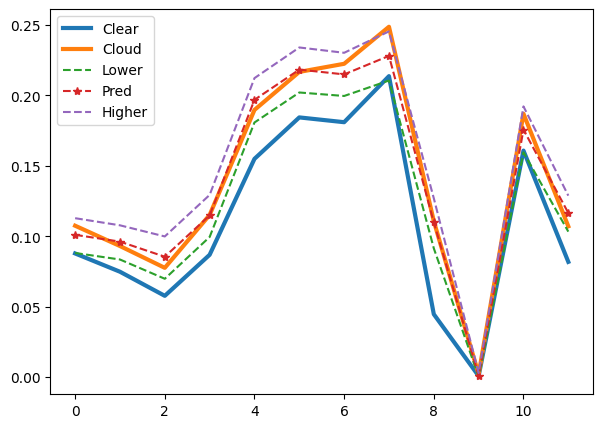

...

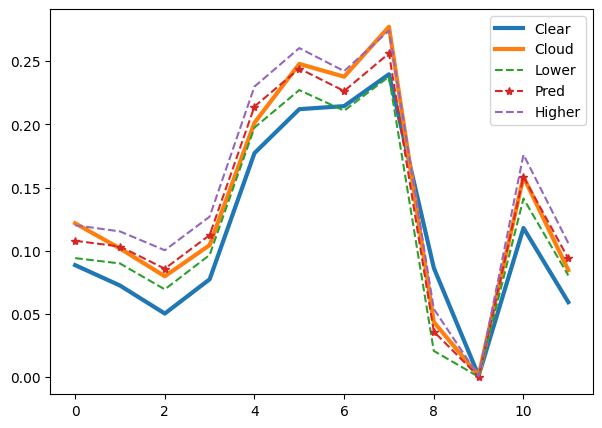

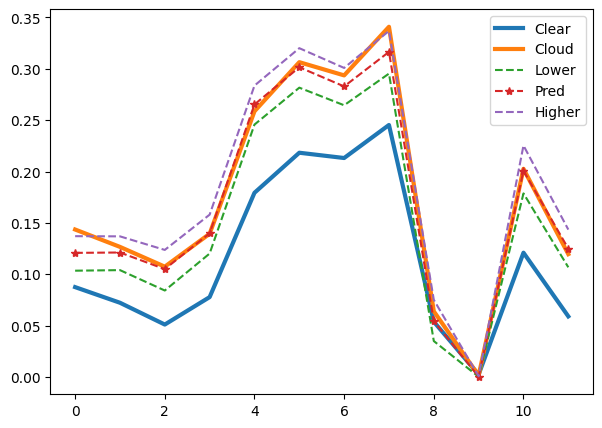

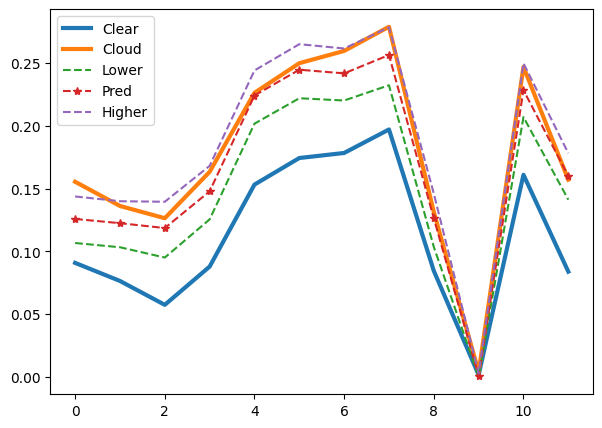

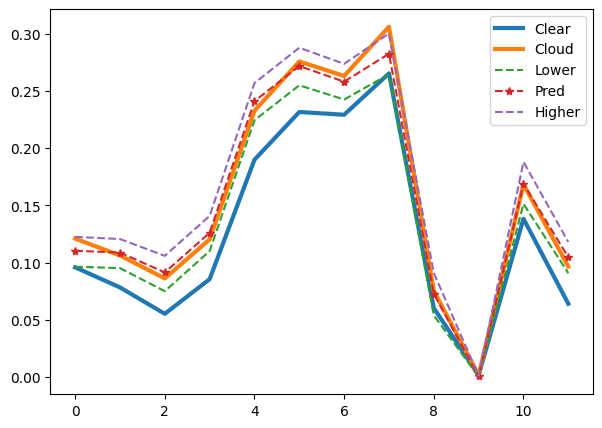

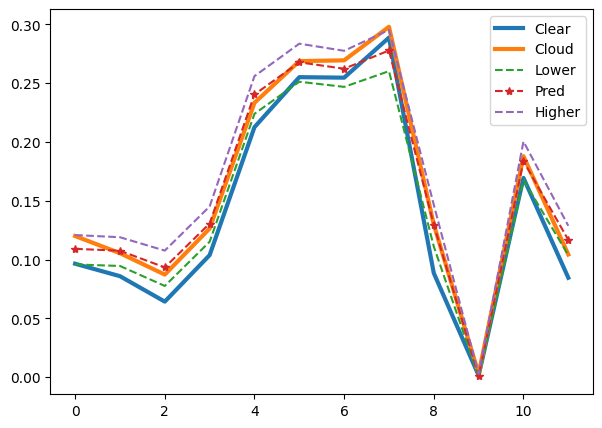

In [30]:
x=np.array([0,1,2,3,4,5,6,7,8,9,10,11])

for i,pair in enumerate(ims_all):
    im_clear=pair[0]
    im_cloud=pair[1]
    im_pred=preds_all[i]
    im_lower=lower_all[i]
    im_higher=higher_all[i]

    plt.figure()
    plt.plot(x,np.mean(im_clear[:,:,:12],axis=(0,1)),label='Clear',linewidth=3)
    plt.plot(x,np.mean(im_cloud[:,:,:12],axis=(0,1)),label='Cloud',linewidth=3)
    plt.plot(x,np.mean(im_lower[:,:,:12],axis=(0,1)),'--',label='Lower')
    plt.plot(x,np.mean(im_pred[:,:,:12],axis=(0,1)),'--*',label='Pred')
    plt.plot(x,np.mean(im_higher[:,:,:12],axis=(0,1)),'--',label='Higher')
    plt.legend()
    plt.show()

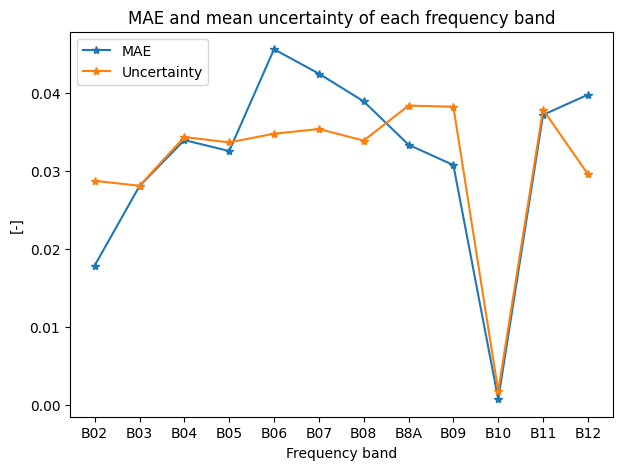

(101262,)
(101262,)
1.246142319847271
PearsonRResult(statistic=0.7346526641936504, pvalue=0.0)


In [31]:
bands=np.array([0,1,2,3,4,5,6,7,8,9,10,11])
x=np.arange(np.size(bands))

plt.rcParams['figure.figsize'] = [7, 5]

plt.figure()
plt.plot(x,np.mean(np.abs(clear_r-pred_r),axis=0),'-*')
plt.plot(x,np.mean(unc_r,axis=0),'-*')
plt.xticks(x, ['B02','B03','B04','B05','B06','B07','B08','B8A','B09','B10','B11','B12'])
plt.xlabel('Frequency band')
plt.ylabel('[-]')
plt.legend(['MAE','Uncertainty'],loc='upper left')

plt.title('MAE and mean uncertainty of each frequency band')
plt.show()

abs_errors = np.mean(np.abs(clear_r-pred_r),axis=1)
uncs = np.mean(unc_r,axis=1)
print(abs_errors.shape)
print(uncs.shape)
print(np.mean(uncs/abs_errors))

import scipy
print(scipy.stats.pearsonr(abs_errors,uncs))

Thin cloud case studies:

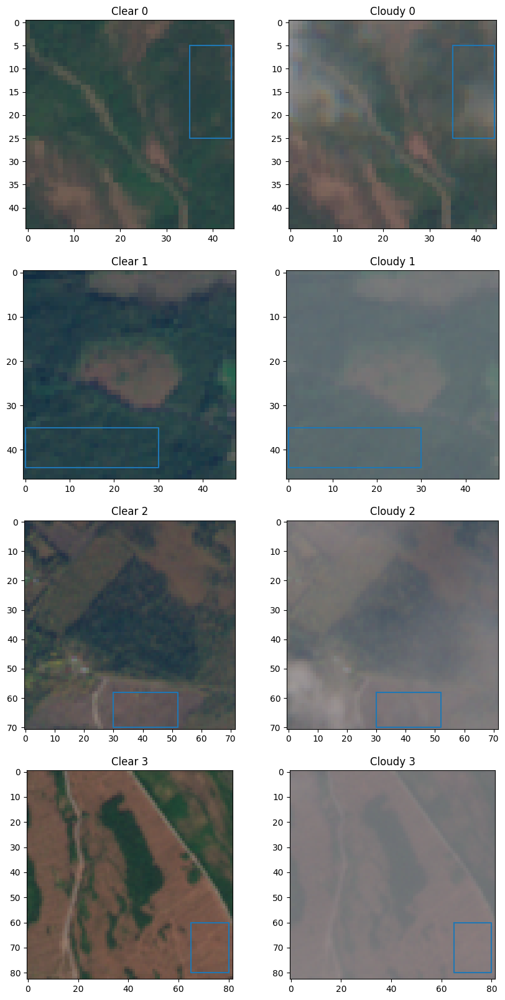

In [32]:
thin_pairs=[0,2,6,10]

box1= np.array([[35,44],[5,25]])
box2= np.array([[0,30],[35,44]])
box3= np.array([[30,52],[58,70]])
box4= np.array([[65,80],[60,80]])

thin_boxes=[]
thin_boxes.append(box1)
thin_boxes.append(box2)
thin_boxes.append(box3)
thin_boxes.append(box4)



#Print clear, cloudy and predictions
ncols=2
nrows=len(thin_pairs)

plt.rcParams['figure.figsize'] = [5*ncols, 5*nrows]
fig,axs=plt.subplots(ncols=ncols,nrows=nrows)

pair_c=0
for i,pair in enumerate(thin_pairs):
    pair = ims_all[pair]
    im_clear=pair[0]
    im_cloud=pair[1]
    box=thin_boxes[i]

    axs[pair_c,0].imshow(hf.Sentinel2TrueColor(im_clear))
    axs[pair_c,0].plot([box[0,0],box[0,1],box[0,1],box[0,0],box[0,0]],[box[1,0],box[1,0],box[1,1],box[1,1],box[1,0]])
    axs[pair_c,0].set_title('Clear %i'%pair_c)
    axs[pair_c,1].imshow(hf.Sentinel2TrueColor(im_cloud))
    axs[pair_c,1].plot([box[0,0],box[0,1],box[0,1],box[0,0],box[0,0]],[box[1,0],box[1,0],box[1,1],box[1,1],box[1,0]])
    axs[pair_c,1].set_title('Cloudy %i'%pair_c)
    pair_c+=1


Clear for:[0.09130593 0.07033481 0.04393667 0.07179704 0.17569852 0.21315926
 0.21099037 0.23912889 0.07282    0.00154667 0.08618667 0.03325481]
Cloudy for:[0.13379778 0.1133     0.08838481 0.11093704 0.20927926 0.25705333
 0.24445556 0.28486963 0.06135333 0.00484    0.11506519 0.05640815]
Clear dirt:[0.101942   0.09532067 0.117603   0.14800033 0.18569267 0.212772
 0.220511   0.25109867 0.117217   0.00155233 0.26246033 0.15151033]
Cloudy dirt:[0.160048   0.141733   0.14613933 0.172754   0.21913333 0.24382
 0.24295367 0.27049533 0.10555533 0.001816   0.17988767 0.11372667]


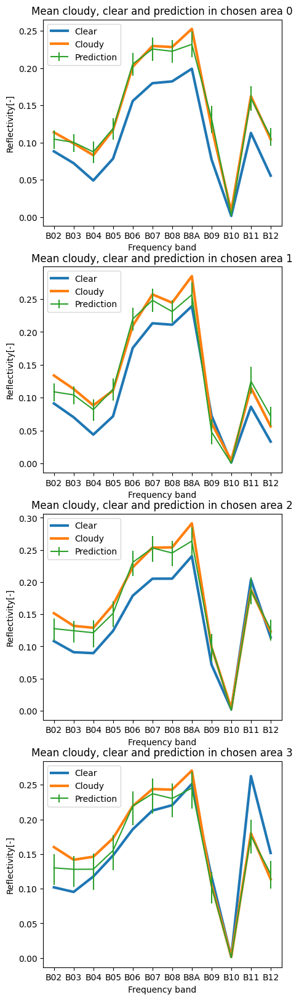

In [33]:

#Print clear, cloudy and predictions
ncols=1
nrows=len(thin_pairs)

plt.rcParams['figure.figsize'] = [5*ncols, 5*nrows]
fig,axs=plt.subplots(ncols=ncols,nrows=nrows)


pair_c=0
for i,img in enumerate(thin_pairs):
    pair = ims_all[img]
    im_clear=pair[0]
    im_cloud=pair[1]
    im_pred=preds_all[img]
    im_lower=lower_all[img]
    im_higher=higher_all[img]
    box=thin_boxes[i]

    clear_box=im_clear[box[1,0]:box[1,1],box[0,0]:box[0,1],:]
    cloud_box=im_cloud[box[1,0]:box[1,1],box[0,0]:box[0,1],:]
    pred_box=im_pred[box[1,0]:box[1,1],box[0,0]:box[0,1],:]

    lower_mean=np.mean(im_lower[box[1,0]:box[1,1],box[0,0]:box[0,1],:],axis=(0,1))
    higher_mean=np.mean(im_higher[box[1,0]:box[1,1],box[0,0]:box[0,1],:],axis=(0,1))
    pred_mean = np.mean(pred_box,axis=(0,1))
    pred_err=np.concatenate(((pred_mean-lower_mean).reshape(1,12),(higher_mean-pred_mean).reshape(1,12)),axis=0)

    if i == 1:
        print('Clear for:' +str(np.mean(clear_box[:,:,:12],axis=(0,1))))
        print('Cloudy for:' +str(np.mean(cloud_box[:,:,:12],axis=(0,1))))

    if i == 3:
        print('Clear dirt:' +str(np.mean(clear_box[:,:,:12],axis=(0,1))))
        print('Cloudy dirt:' +str(np.mean(cloud_box[:,:,:12],axis=(0,1))))

    axs[pair_c].plot(np.arange(12),np.mean(clear_box[:,:,:12],axis=(0,1)),linewidth=3,label='Clear')
    axs[pair_c].plot(np.arange(12),np.mean(cloud_box[:,:,:12],axis=(0,1)),linewidth=3,label='Cloudy')
    axs[pair_c].errorbar(np.arange(12),pred_mean,pred_err,label='Prediction')
    axs[pair_c].set_title('Mean cloudy, clear and prediction in chosen area %i'%i)
    axs[pair_c].legend(loc='upper left')
    axs[pair_c].set_xticks(np.arange(12), ['B02','B03','B04','B05','B06','B07','B08','B8A','B09','B10','B11','B12'])
    axs[pair_c].set_xlabel('Frequency band')
    axs[pair_c].set_ylabel('Reflectivity[-]')
    pair_c+=1    


No cloud case study:

Clear forest mean: [0.09130593 0.07033481 0.04393667 0.07179704 0.17569852 0.21315926
 0.21099037 0.23912889 0.07282    0.00154667 0.08618667 0.03325481]


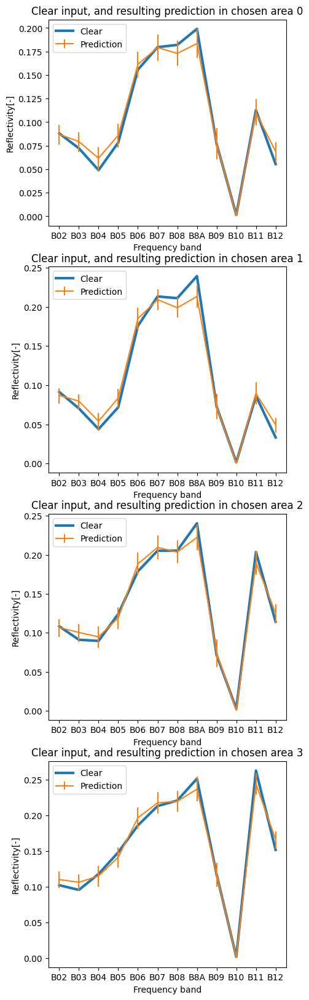

In [34]:

#Print clear, cloudy and predictions
ncols=1
nrows=len(thin_pairs)

plt.rcParams['figure.figsize'] = [5*ncols, 5*nrows]
fig,axs=plt.subplots(ncols=ncols,nrows=nrows)


pair_c=0
for i,img in enumerate(thin_pairs):
    pair = ims_all[img]
    im_clear=pair[0]
    box=thin_boxes[i]
    clear_box=im_clear[box[1,0]:box[1,1],box[0,0]:box[0,1],:]

    ## Reshape clear data
    im_shape=np.shape(clear_box)
    im_clear_r=np.zeros((im_shape[0]*im_shape[1],im_shape[2]))
    for j in range(im_shape[2]):
        im_clear_r[:,j]=np.reshape(clear_box[:,:,j],im_shape[0]*im_shape[1])

    if i == 1:
        print('Clear forest mean: ' + str(np.mean(im_clear_r[:,:12],axis=0)))

    ## Make prediction
    for k,model in enumerate(models):
        if k==0:
            pred=model.predict(im_clear_r)
        else:   
            pred=pred+model.predict(im_clear_r)
    pred=pred/len(models)

    preds=pred[:,:,est]
    lower=pred[:,:,0]
    higher=pred[:,:,-1]

    lower_mean=np.mean(lower,axis=0)
    higher_mean=np.mean(higher,axis=0)
    pred_mean = np.mean(preds,axis=0)
    pred_err=np.concatenate(((pred_mean-lower_mean).reshape(1,12),(higher_mean-pred_mean).reshape(1,12)),axis=0)

    axs[pair_c].plot(np.arange(12),np.mean(clear_box[:,:,:12],axis=(0,1)),linewidth=3,label='Clear')
    axs[pair_c].errorbar(np.arange(12),pred_mean,pred_err,label='Prediction')
    axs[pair_c].set_title('Clear input, and resulting prediction in chosen area %i'%i)
    axs[pair_c].legend(loc='upper left')
    axs[pair_c].set_xticks(np.arange(12), ['B02','B03','B04','B05','B06','B07','B08','B8A','B09','B10','B11','B12'])
    axs[pair_c].set_xlabel('Frequency band')
    axs[pair_c].set_ylabel('Reflectivity[-]')
    pair_c+=1    


And now thick cloudy areas:

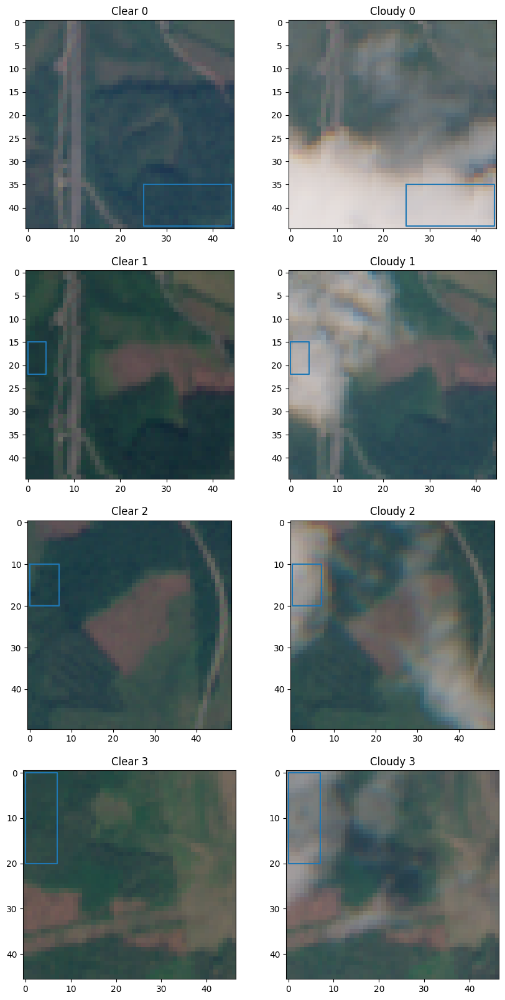

In [35]:
thick_pairs=[12,14,16,17]

box1= np.array([[25,44],[35,44]])
box2= np.array([[0,4],[15,22]])
box3= np.array([[0,7],[10,20]])
box4= np.array([[0,7],[0,20]])

thick_boxes=[]
thick_boxes.append(box1)
thick_boxes.append(box2)
thick_boxes.append(box3)
thick_boxes.append(box4)



#Print clear, cloudy and predictions
ncols=2
nrows=len(thick_pairs)

plt.rcParams['figure.figsize'] = [5*ncols, 5*nrows]
fig,axs=plt.subplots(ncols=ncols,nrows=nrows)

pair_c=0
for i,pair in enumerate(thick_pairs):
    pair = ims_all[pair]
    im_clear=pair[0]
    im_cloud=pair[1]
    box=thick_boxes[i]

    axs[pair_c,0].imshow(hf.Sentinel2TrueColor(im_clear))
    axs[pair_c,0].plot([box[0,0],box[0,1],box[0,1],box[0,0],box[0,0]],[box[1,0],box[1,0],box[1,1],box[1,1],box[1,0]])
    axs[pair_c,0].set_title('Clear %i'%pair_c)
    axs[pair_c,1].imshow(hf.Sentinel2TrueColor(im_cloud))
    axs[pair_c,1].plot([box[0,0],box[0,1],box[0,1],box[0,0],box[0,0]],[box[1,0],box[1,0],box[1,1],box[1,1],box[1,0]])
    axs[pair_c,1].set_title('Cloudy %i'%pair_c)
    pair_c+=1


Clear for:[0.08043571 0.06286429 0.03732857 0.06207143 0.18082143 0.22573571
 0.21981786 0.25429286 0.06051429 0.00202857 0.0957     0.04009286]
Cloudy for:[0.27504643 0.26315    0.26895714 0.29654286 0.41682143 0.47202143
 0.45152857 0.51141429 0.10038571 0.00164286 0.39683571 0.29683571]
Clear dirt:[0.08962214 0.07523714 0.04737429 0.08039143 0.18633286 0.22584857
 0.22231143 0.25041143 0.07528286 0.00135857 0.10259    0.04547571]
Cloudy dirt:[0.16908357 0.15155    0.13829071 0.17597    0.28260286 0.31920143
 0.31582714 0.34507    0.16061    0.00443714 0.22498429 0.16093714]


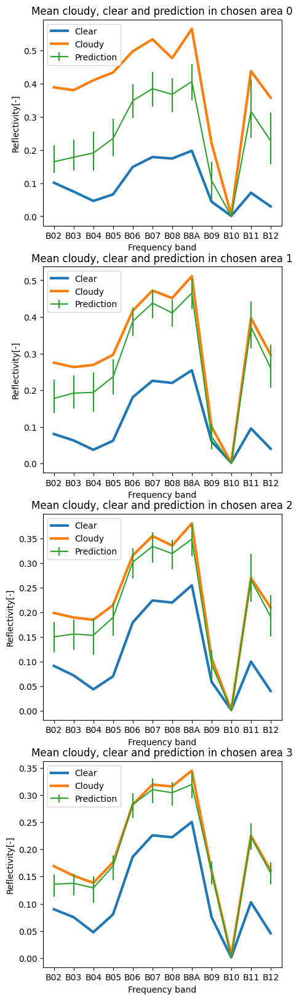

In [36]:

#Print clear, cloudy and predictions
ncols=1
nrows=len(thick_pairs)

plt.rcParams['figure.figsize'] = [5*ncols, 5*nrows]
fig,axs=plt.subplots(ncols=ncols,nrows=nrows)


pair_c=0
for i,img in enumerate(thick_pairs):
    pair = ims_all[img]
    im_clear=pair[0]
    im_cloud=pair[1]
    im_pred=preds_all[img]
    im_lower=lower_all[img]
    im_higher=higher_all[img]
    box=thick_boxes[i]

    clear_box=im_clear[box[1,0]:box[1,1],box[0,0]:box[0,1],:]
    cloud_box=im_cloud[box[1,0]:box[1,1],box[0,0]:box[0,1],:]
    pred_box=im_pred[box[1,0]:box[1,1],box[0,0]:box[0,1],:]

    lower_mean=np.mean(im_lower[box[1,0]:box[1,1],box[0,0]:box[0,1],:],axis=(0,1))
    higher_mean=np.mean(im_higher[box[1,0]:box[1,1],box[0,0]:box[0,1],:],axis=(0,1))
    pred_mean = np.mean(pred_box,axis=(0,1))
    pred_err=np.concatenate(((pred_mean-lower_mean).reshape(1,12),(higher_mean-pred_mean).reshape(1,12)),axis=0)

    if i == 1:
        print('Clear for:' +str(np.mean(clear_box[:,:,:12],axis=(0,1))))
        print('Cloudy for:' +str(np.mean(cloud_box[:,:,:12],axis=(0,1))))

    if i == 3:
        print('Clear dirt:' +str(np.mean(clear_box[:,:,:12],axis=(0,1))))
        print('Cloudy dirt:' +str(np.mean(cloud_box[:,:,:12],axis=(0,1))))

    axs[pair_c].plot(np.arange(12),np.mean(clear_box[:,:,:12],axis=(0,1)),linewidth=3,label='Clear')
    axs[pair_c].plot(np.arange(12),np.mean(cloud_box[:,:,:12],axis=(0,1)),linewidth=3,label='Cloudy')
    axs[pair_c].errorbar(np.arange(12),pred_mean,pred_err,label='Prediction')
    axs[pair_c].set_title('Mean cloudy, clear and prediction in chosen area %i'%i)
    axs[pair_c].legend(loc='upper left')
    axs[pair_c].set_xticks(np.arange(12), ['B02','B03','B04','B05','B06','B07','B08','B8A','B09','B10','B11','B12'])
    axs[pair_c].set_xlabel('Frequency band')
    axs[pair_c].set_ylabel('Reflectivity[-]')
    pair_c+=1    


In [45]:
im_cloud[:,:,-1]

array([[36.49323455, 36.49323455, 36.49323455, ..., 36.49323455,
        36.49323455, 36.49323455],
       [36.49323455, 36.49323455, 36.49323455, ..., 36.49323455,
        36.49323455, 36.49323455],
       [36.49323455, 36.49323455, 36.49323455, ..., 36.49323455,
        36.49323455, 36.49323455],
       ...,
       [36.49323455, 36.49323455, 36.49323455, ..., 36.49323455,
        36.49323455, 36.49323455],
       [36.49323455, 36.49323455, 36.49323455, ..., 36.49323455,
        36.49323455, 36.49323455],
       [36.49323455, 36.49323455, 36.49323455, ..., 36.49323455,
        36.49323455, 36.49323455]])

In [46]:
clear_array=np.zeros((1,12))
pred_array=np.zeros((1,12))
cloud_array=np.zeros((1,14))
unc_array=np.zeros((1,12))
cloud_mask_array=np.zeros((1))
p_c=0
percent=0.2
for i,pair in enumerate(ims_all):

    im_cloud=pair[1]
    im_clear=pair[0]
    im_pred=preds_all[i]
    im_unc=uncertainties_all[i]

    im_shape=np.shape(im_pred)
    c_mask=im_cloud[:,:,-1]
    c_mask_r=np.reshape(c_mask,im_shape[0]*im_shape[1])


    im_pred_r=np.zeros((im_shape[0]*im_shape[1],im_shape[2])) #+1 for sun zenith angle
    im_clear_r=np.zeros((im_shape[0]*im_shape[1],im_shape[2]+1)) #+1 for sun zenith angle
    im_cloud_r=np.zeros((im_shape[0]*im_shape[1],im_shape[2]+2)) #+1 for sun zenith angle
    im_unc_r=np.zeros((im_shape[0]*im_shape[1],im_shape[2]))

    for i in range(im_shape[2]):
        im_pred_r[:,i]=np.reshape(im_pred[:,:,i],im_shape[0]*im_shape[1])
        im_clear_r[:,i]=np.reshape(im_clear[:,:,i],im_shape[0]*im_shape[1])
        im_cloud_r[:,i]=np.reshape(im_cloud[:,:,i],im_shape[0]*im_shape[1])
        im_unc_r[:,i]=np.reshape(im_unc[:,:,i],im_shape[0]*im_shape[1])

    im_clear_r[:,12]=np.reshape(im_clear[:,:,12],im_shape[0]*im_shape[1])
    im_cloud_r[:,12]=np.reshape(im_cloud[:,:,12],im_shape[0]*im_shape[1])
    #im_cloud_r[:,13]=np.reshape(im_cloud[:,:,13],im_shape[0]*im_shape[1])

    clear_array=np.concatenate((clear_array,im_clear_r[:,0:12]))
    pred_array=np.concatenate((pred_array,im_pred_r))
    cloud_array=np.concatenate((cloud_array,im_cloud_r))
    unc_array=np.concatenate((unc_array,im_unc_r))
    cloud_mask_array=np.concatenate((cloud_mask_array,c_mask_r))

    p_c+=1


/home/edgelab/.local/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/edgelab/.local/lib/python3.10/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


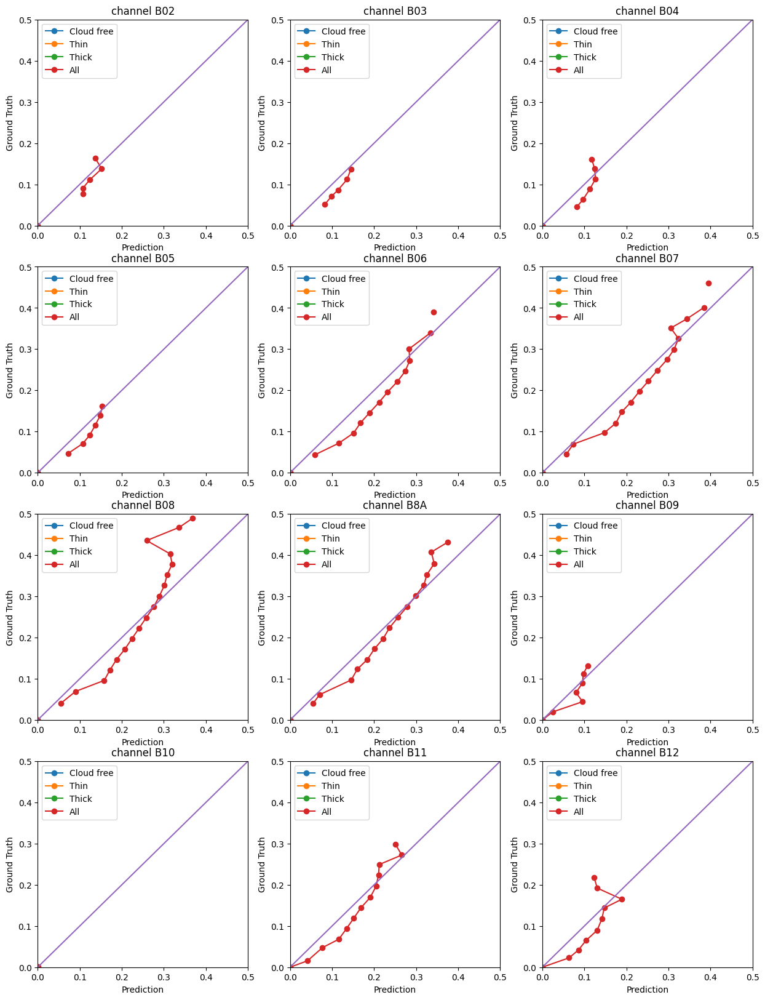

In [47]:


ncols=3
nrows=int(12/ncols)
plt.rcParams["figure.figsize"] = [5*ncols, 5*nrows]
fig,axs=plt.subplots(ncols=ncols,nrows=nrows)


col_count=0
row_count=0
for i in range(12):
    band=i
    ## Prediction v Ground Truth ##
    y_true_11=clear_array[:,band]
    pred_y_11=pred_array[:,band]
    bins=np.linspace(0,0.5,20)

    freq_true=np.zeros(len(bins))
    freq_pred=np.zeros(len(bins))

    freq_true_zero=np.zeros(len(bins))
    freq_pred_zero=np.zeros(len(bins))

    freq_true_thin=np.zeros(len(bins))
    freq_pred_thin=np.zeros(len(bins))

    freq_true_med=np.zeros(len(bins))
    freq_pred_med=np.zeros(len(bins))

    clear_true=clear_array[cloud_mask_array==0,:]
    thin_true=clear_array[cloud_mask_array==1,:]
    semi_true=clear_array[cloud_mask_array==2,:]

    y_tmp_zero=clear_true[:,band]
    y_tmp_thin=thin_true[:,band]
    y_tmp_med=semi_true[:,band]

    clear_pred=pred_array[cloud_mask_array==0,:]
    thin_pred=pred_array[cloud_mask_array==1,:]
    semi_pred=pred_array[cloud_mask_array==2,:]

    y_tmp_pred_zero=clear_pred[:,band]
    y_tmp_pred_thin=thin_pred[:,band]
    y_tmp_pred_med=semi_pred[:,band]

    for j,edge in enumerate(bins):
        if j!=0:
            indices=(y_true_11>bins[j-1])&(y_true_11<=edge)
            ind_z=(y_tmp_zero>bins[j-1])&(y_tmp_zero<=edge)
            ind_t=(y_tmp_thin>bins[j-1])&(y_tmp_thin<=edge)
            ind_m=(y_tmp_med>bins[j-1])&(y_tmp_med<=edge)

            mean_bin_true=np.mean(y_true_11[indices])
            mean_bin_pred=np.mean(pred_y_11[indices])

            mean_bin_true_zero=np.mean(y_tmp_zero[ind_z])
            mean_bin_pred_zero=np.mean(y_tmp_pred_zero[ind_z])

            mean_bin_true_thin=np.mean(y_tmp_thin[ind_t])
            mean_bin_pred_thin=np.mean(y_tmp_pred_thin[ind_t])

            mean_bin_true_med=np.mean(y_tmp_med[ind_m])
            mean_bin_pred_med=np.mean(y_tmp_pred_med[ind_m])
            
            freq_true[j]=mean_bin_true
            freq_pred[j]=mean_bin_pred


            freq_true_zero[j]=mean_bin_true_zero
            freq_pred_zero[j]=mean_bin_pred_zero


            freq_true_thin[j]=mean_bin_true_thin
            freq_pred_thin[j]=mean_bin_pred_thin


            freq_true_med[j]=mean_bin_true_med
            freq_pred_med[j]=mean_bin_pred_med

    if col_count==ncols:
        col_count=0
        row_count=row_count+1

    axs[row_count,col_count].plot(freq_pred_zero,freq_true_zero,'-o')
    axs[row_count,col_count].plot(freq_pred_thin,freq_true_thin,'-o')
    axs[row_count,col_count].plot(freq_pred_med,freq_true_med,'-o')
    axs[row_count,col_count].plot(freq_pred,freq_true,'-o')

    #plt.plot(cloudy_sort,'.')
    line=np.linspace(0,1,100)
    axs[row_count,col_count].plot(line,line)

    axs[row_count,col_count].legend(['Cloud free','Thin','Thick','All'])
    axs[row_count,col_count].set_xlabel("Prediction")
    axs[row_count,col_count].set_ylabel("Ground Truth")
    axs[row_count,col_count].set_xlim([0,0.5])
    axs[row_count,col_count].set_ylim([0,0.5])
    if i<7:
        axs[row_count,col_count].set_title("channel B0"+str(i+2))
    elif i==7:
        axs[row_count,col_count].set_title("channel B8A")
    elif i==8:
        axs[row_count,col_count].set_title("channel B09")
    else:
        axs[row_count,col_count].set_title("channel B"+str(i+1))
        

    col_count=col_count+1

